# Portland House Group - Quantitative Research Internship Test
Name: Thomas Ton <br>
<br>
Email: tonbao30@gmail.com

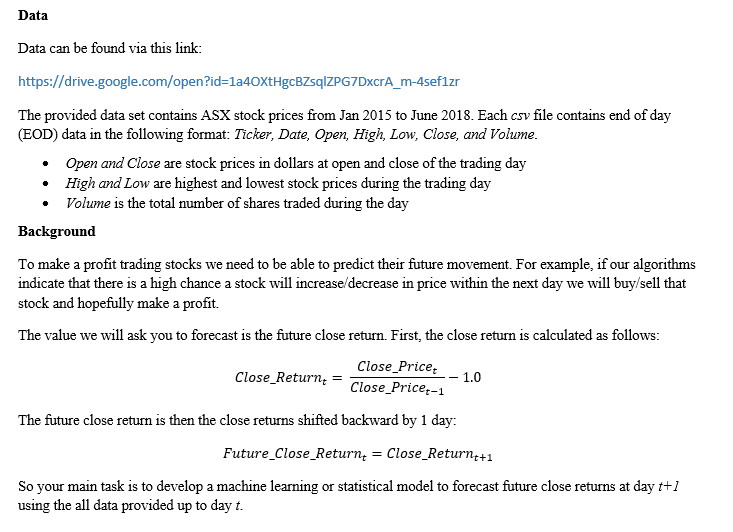

Please uncomment and install these libraries below if you don't have it

In [1]:

# !pip install seaborn
# !pip install pyplot
# !pip  install mpl-finance
# !pip install plotly
# !pip install statsmodels

## Uncomment if you haven't install h2o
# ! pip install requests
# ! pip install tabulate
# ! pip install "colorama>=0.3.8"
# ! pip install future
# ! pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

In [2]:
# import numpy as np
import pickle
# import pyplot
import pandas as pd
from matplotlib import pyplot
# import math
# import sklearn
# import sklearn.preprocessing
# import datetime
import os
# import matplotlib.pyplot as plt
# import tensorflow as tf
import glob
import numpy as np
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 4)})
# # split data in 80%/10%/10% train/validation/test sets
# valid_set_size_percentage = 10 
# test_set_size_percentage = 10 


# Load all data from the extracted folder

In [3]:
path = r'.\ASX-2015-2018'                     # use your path
all_files = glob.glob(os.path.join(path, "*.txt"))     # advisable to use os.path.join as this makes concatenation OS independent

all_files = all_files[:-1] #exclude README file
df_from_each_file = (pd.read_csv(f,header=None) for f in all_files)
df   = pd.concat(df_from_each_file, ignore_index=True)
# doesn't create a list, nor does it append to one

In [4]:
#Ticker, Date, Open, High, Low, Close, and Volume.
df.columns = ['ticker', 'date', 'open', 'high', 'low', 'close',  'volume']
df['date'] =  pd.to_datetime(df['date'], format='%Y%m%d')

# number of different stocks
uniq_stock = list(set(df.ticker))
print('\nnumber of different stocks: ', len(uniq_stock))
print(uniq_stock[:10])
df.head()


number of different stocks:  2773
['ANQ', 'RGS', 'AEF', 'EME', 'ALC', 'N1H', 'ZEN', 'BGT', 'SXT', 'GOZ']


,ticker,date,open,high,low,close,volume
0,1PG,2015-01-02,1.195,1.240,1.16,1.215,607639
1,3PL,2015-01-02,2.290,2.290,2.17,2.260,1863
2,8IH,2015-01-02,0.340,0.345,0.34,0.340,112700
3,AAA,2015-01-02,50.100,50.110,50.09,50.110,409863
4,AAC,2015-01-02,1.455,1.470,1.45,1.470,90150


In [5]:
df = df.sort_values(['ticker','date']).reset_index(drop=True)
df['close_return'] = df.groupby('ticker')['close'].pct_change()
df['future_return'] = df['close_return'].shift(periods=-1)
df['hi_lo'] = df['high']/df['low']



df = df.set_index('date')
df.head()

with open(r"main_df.pickle", "wb") as output_file:
    pickle.dump(df, output_file)


# 1. Preprocessing data

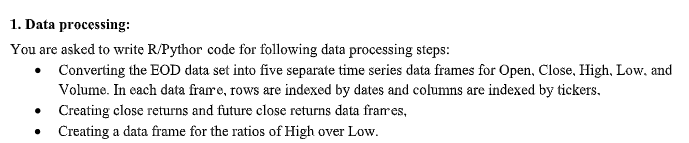

In [6]:
fillna = None

df_open =df.pivot_table(values='open', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_close = df.pivot_table(values='close', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_hi = df.pivot_table(values='high', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_lo = df.pivot_table(values='low', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_vol = df.pivot_table(values='volume', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_clos_re = df.pivot_table(values='close_return', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_fu_re = df.pivot_table(values='future_return', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)
df_hi_lo = df.pivot_table(values='hi_lo', index=df.index, columns='ticker', aggfunc='first', fill_value = fillna)

## Result

In [7]:
print("open dataframe")
print(df_open.head())
print("close dataframe")
print(df_close.head())
print("high dataframe")
print(df_hi.head())
print("low dataframe")
print(df_lo.head())
print("volume dataframe")
print(df_vol.head())
print("close return dataframe")
print(df_clos_re.head())
print("future return dataframe")
print(df_fu_re.head())
print("high/low dataframe")
print(df_hi_lo.head())

open dataframe
ticker      1AD  1AG  1AL    1PG  1ST  3DM  3DP   3PL  4CE  4DS  ...  ZNO  \
date                                                             ...        
2015-01-02  NaN  NaN  NaN  1.195  NaN  NaN  NaN  2.29  NaN  NaN  ...  NaN   
2015-01-05  NaN  NaN  NaN  1.230  NaN  NaN  NaN  2.22  NaN  NaN  ...  NaN   
2015-01-06  NaN  NaN  NaN  1.260  NaN  NaN  NaN  2.06  NaN  NaN  ...  NaN   
2015-01-07  NaN  NaN  NaN  1.245  NaN  NaN  NaN  2.05  NaN  NaN  ...  NaN   
2015-01-08  NaN  NaN  NaN  1.250  NaN  NaN  NaN  2.10  NaN  NaN  ...  NaN   

ticker      ZNT  ZNZ  ZOZI    ZRL    ZTA  ZUSD  ZYB  ZYL  ZYUS  
date                                                            
2015-01-02  NaN  NaN   NaN  0.067    NaN   NaN  NaN  NaN   NaN  
2015-01-05  NaN  4.5   NaN  0.070    NaN   NaN  NaN  NaN   NaN  
2015-01-06  NaN  4.4   NaN    NaN    NaN   NaN  NaN  NaN   NaN  
2015-01-07  NaN  NaN   NaN    NaN  0.003   NaN  NaN  NaN   NaN  
2015-01-08  NaN  NaN   NaN    NaN    NaN   NaN  NaN  Na

# 2. Exploration
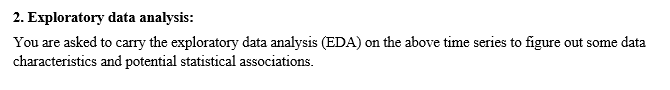

## 2.1. Using the original dataframe

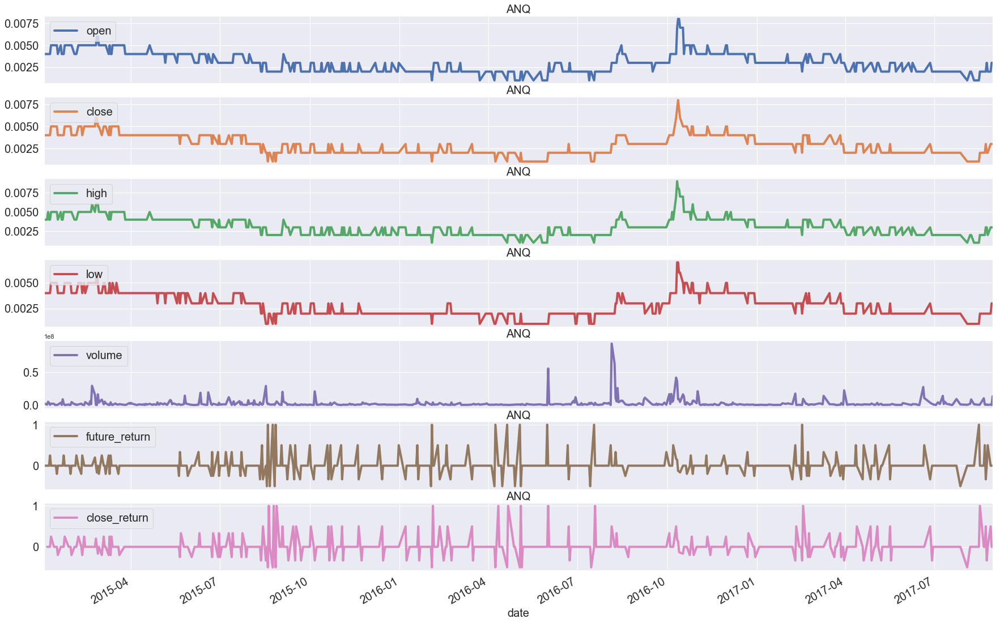

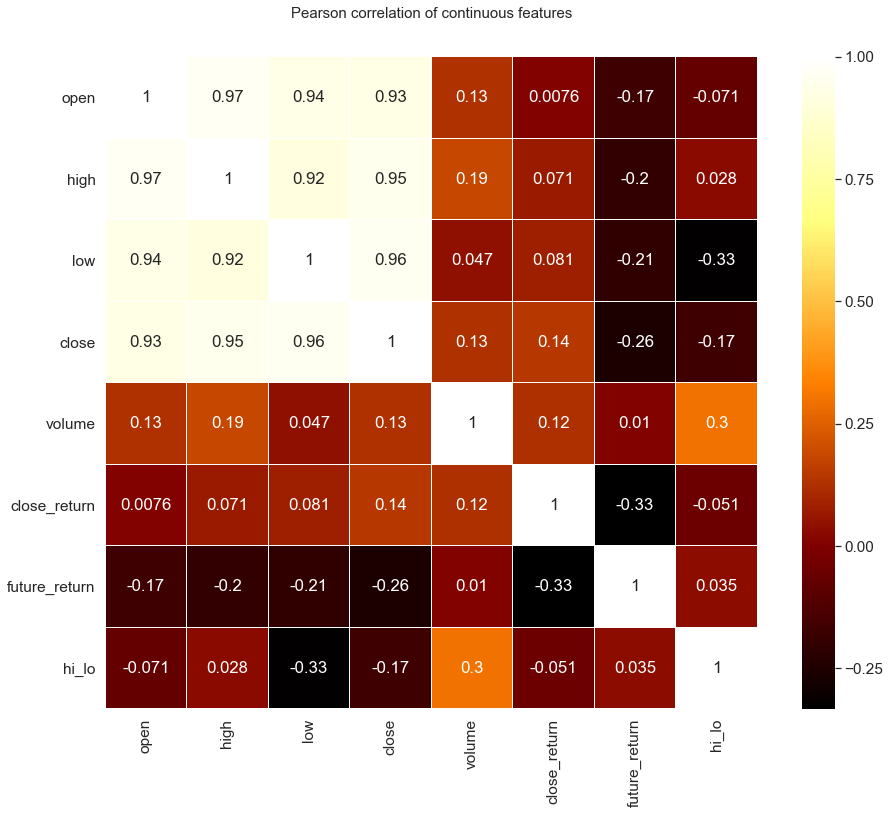

=======AUTO CORRELATION PLOTS=======
How much correlation of each features from day i to the day i-1
auto correlation of open
auto correlation of close
auto correlation of high
auto correlation of low
auto correlation of volume
auto correlation of future_return
auto correlation of close_return


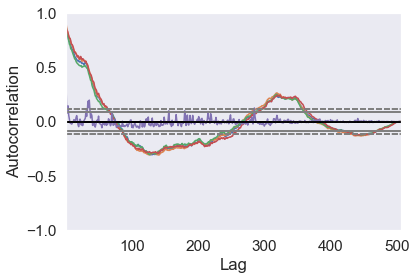

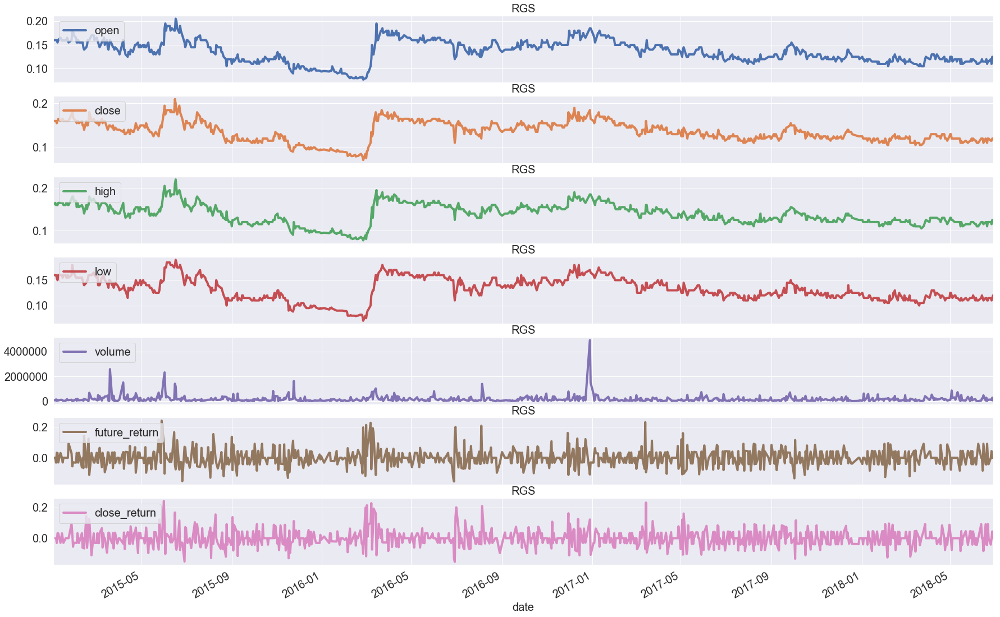

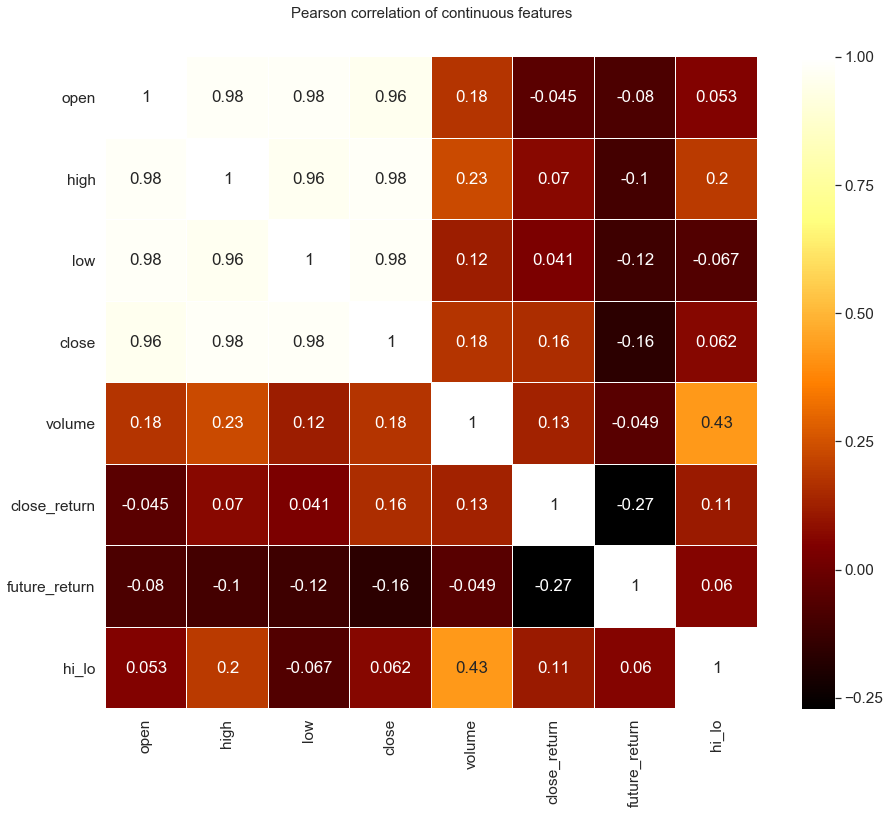

=======AUTO CORRELATION PLOTS=======
How much correlation of each features from day i to the day i-1
auto correlation of open
auto correlation of close
auto correlation of high
auto correlation of low
auto correlation of volume
auto correlation of future_return
auto correlation of close_return


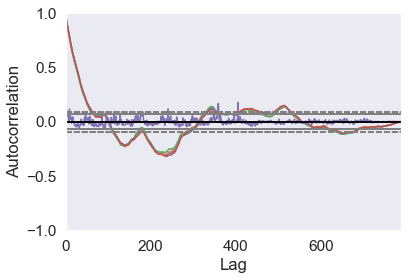

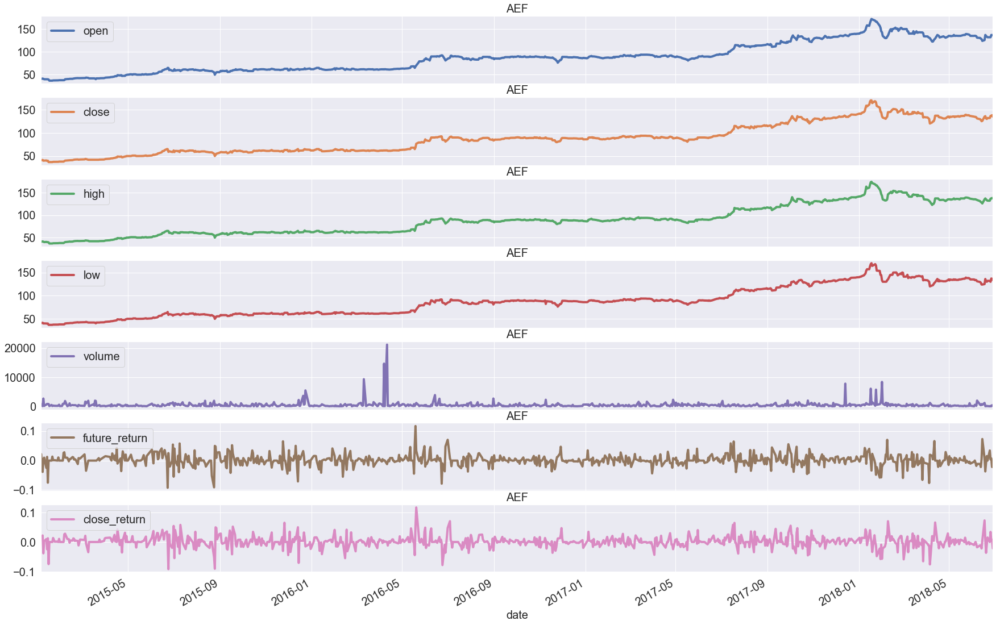

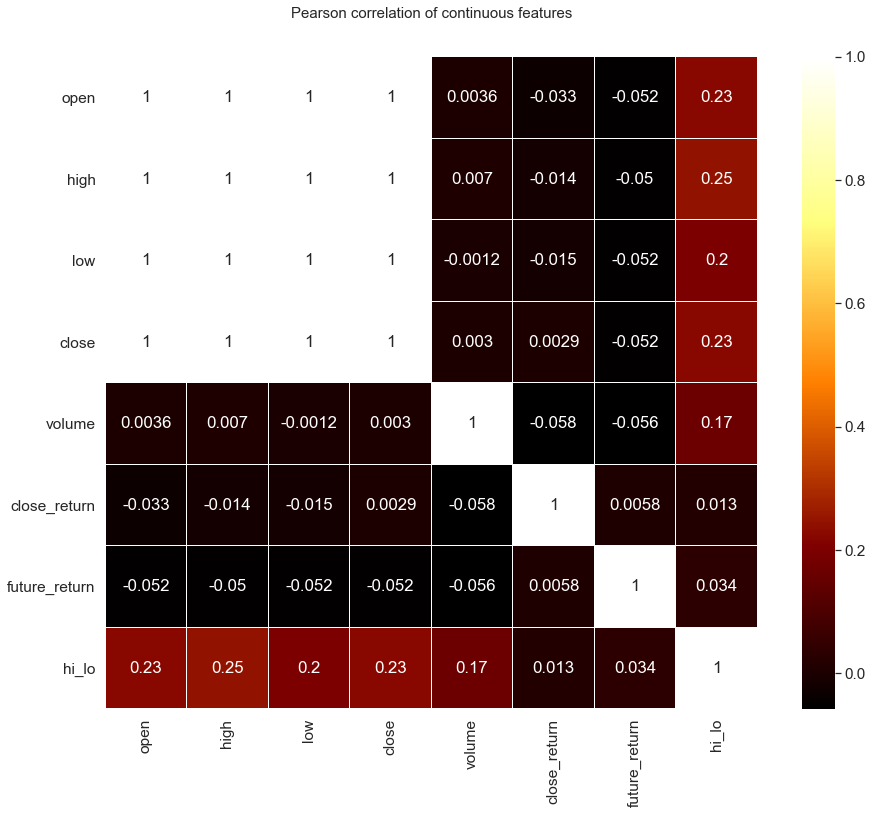

=======AUTO CORRELATION PLOTS=======
How much correlation of each features from day i to the day i-1
auto correlation of open
auto correlation of close
auto correlation of high
auto correlation of low
auto correlation of volume
auto correlation of future_return
auto correlation of close_return


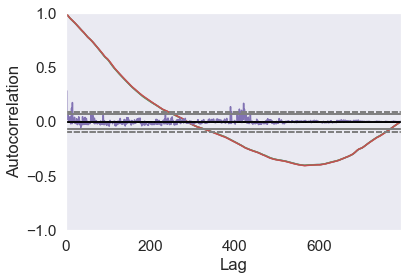

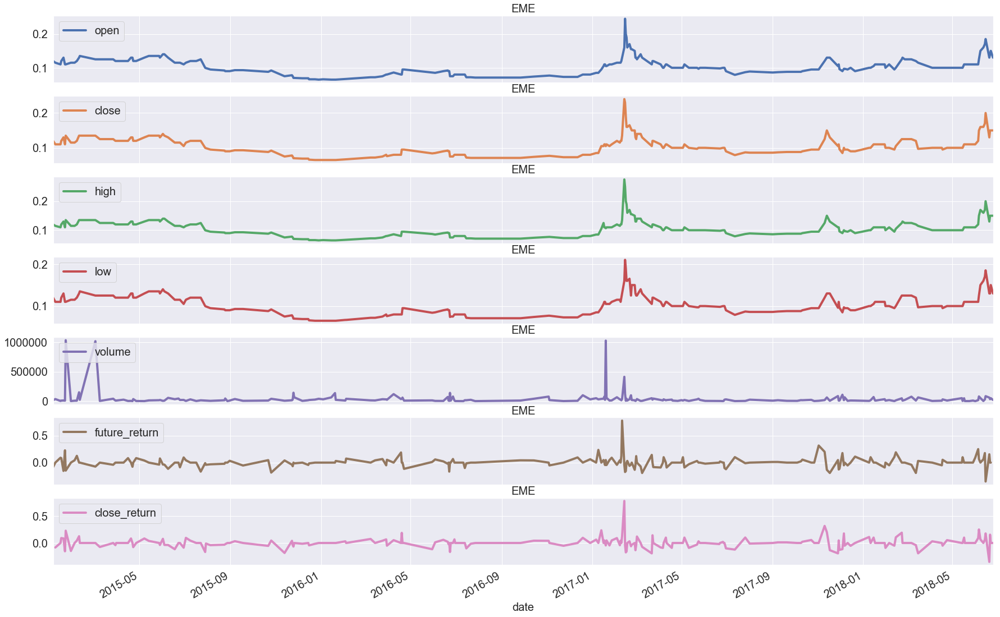

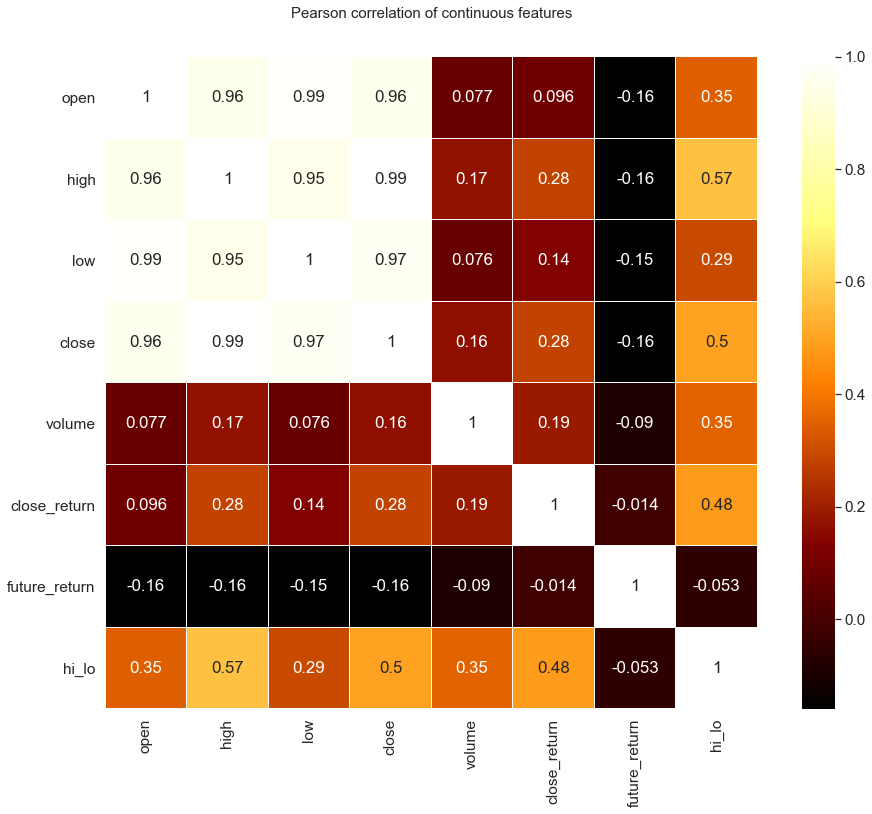

=======AUTO CORRELATION PLOTS=======
How much correlation of each features from day i to the day i-1
auto correlation of open
auto correlation of close
auto correlation of high
auto correlation of low
auto correlation of volume
auto correlation of future_return
auto correlation of close_return


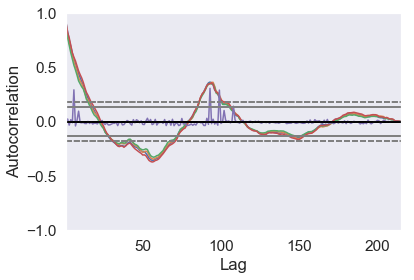

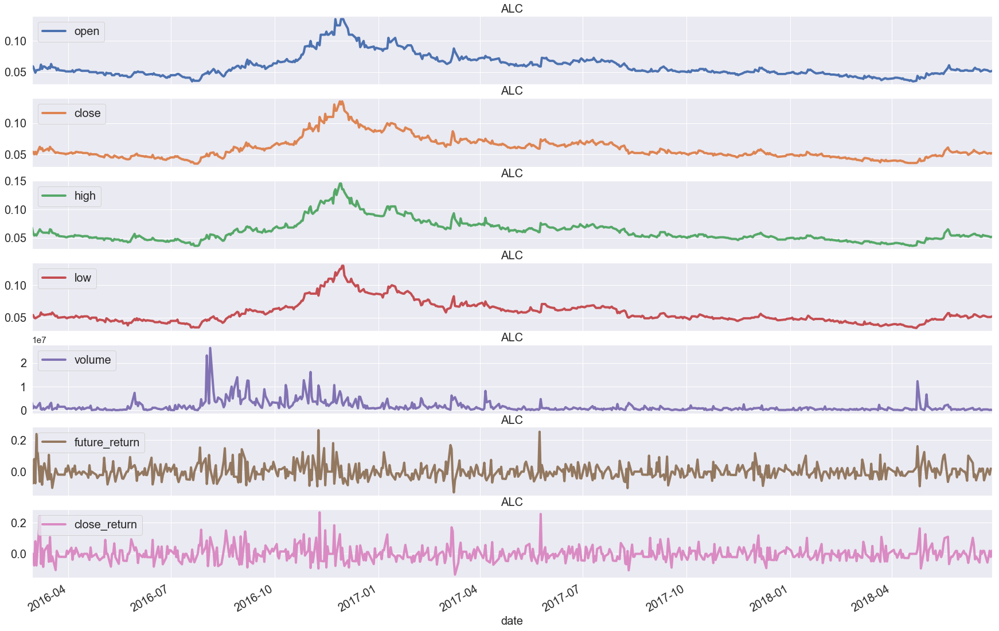

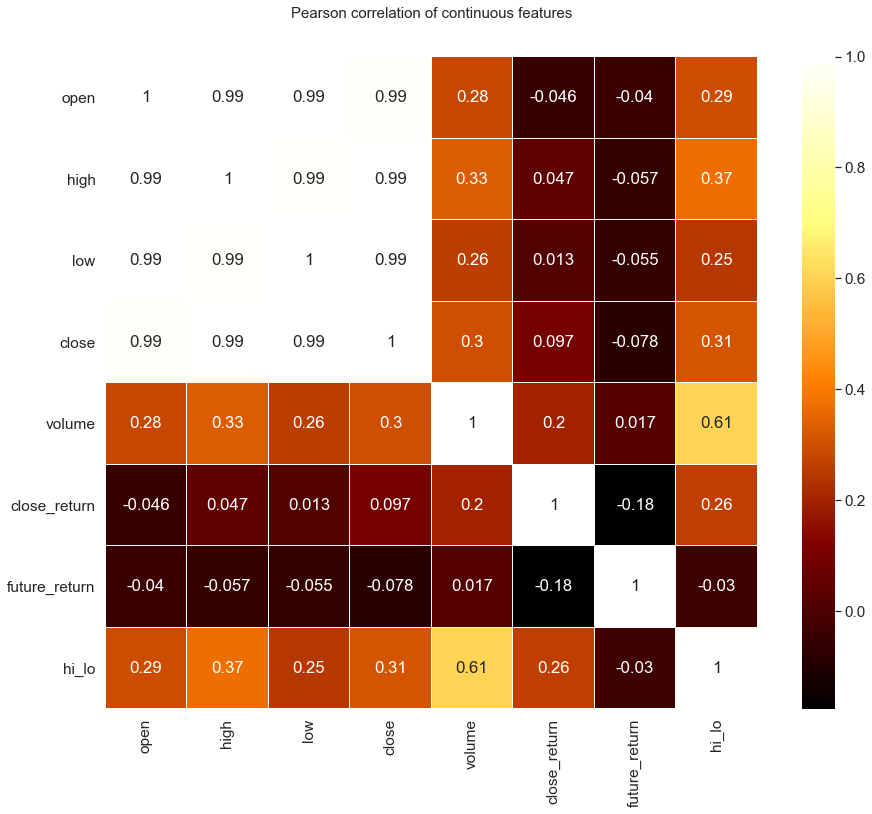

=======AUTO CORRELATION PLOTS=======
How much correlation of each features from day i to the day i-1
auto correlation of open
auto correlation of close
auto correlation of high
auto correlation of low
auto correlation of volume
auto correlation of future_return
auto correlation of close_return


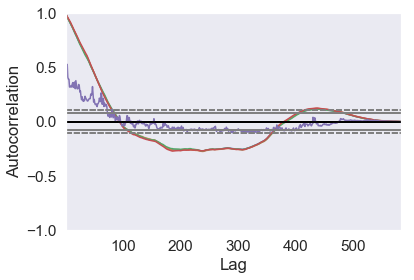

In [8]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
from pandas.plotting import autocorrelation_plot
plt.rcParams.update({'font.size': 40})
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y-%m')

#lets explore first 5 stocks
for idx in range(5):
    select_ticker = uniq_stock[idx]
    selected_df = df[df.ticker== select_ticker]
    cols_plot = ['open', 'close','high','low','volume','future_return','close_return']
    axes = selected_df[cols_plot].plot( alpha=1, linestyle='-', figsize=(30, 20),fontsize=20, linewidth=4, subplots=True)
    for ax in axes:
        #grid and font size
        ax.grid(True)
        ax.set_xlabel('date',fontsize=20)
        ax.set_title(select_ticker,fontsize=20)
        ax.legend(loc=2, fontsize = 20)
    #     ax.set_ylabel('Stock value')
        
        #date adjustment
#         datemin = np.datetime64(selected_df.index[0], 'm')
#         datemax = np.datetime64(selected_df.index[-1], 'm') + np.timedelta64(1, 'm')
#         ax.set_xlim(datemin, datemax)
#         ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
#         

#         ax.xaxis.set_major_locator(months)
#         ax.xaxis.set_major_formatter(years_fmt)
#         ax.xaxis.set_minor_locator(months)
    colormap = pyplot.cm.afmhot
    sns.set(font_scale=1.4)
    pyplot.figure(figsize=(16,12))
    pyplot.title('Pearson correlation of continuous features', y=1.05, size=15)
    sns.heatmap(selected_df.corr(),linewidths=0.1,vmax=1.0, square=True, 
                cmap=colormap, linecolor='white', annot=True)
    pyplot.show()
    print("=======AUTO CORRELATION PLOTS=======")
    print("How much correlation of each features from day i to the day i-1")
    for cols in cols_plot:
        print("auto correlation of", cols)
        autocorrelation_plot(selected_df[cols])


## Analyse:
Open, Close, High, Low are Highly correlated
* From the auto correlation plot:
    * The volume features have the most statistically significant values than other features
    * The future return and close return features lines are match with the 0 line indicate that they are always significant through all times (because they are calcluated based on the previous date)
    * The other freatures (Open, Close, High, Low) for a period of time they are statistically significant **together** because they are higly correlated with each other

How about the new 8 created dataframes?
* As we can see some tickers has too much missing data, that can be problematic for our models later, so we can find some tickers that have no missing data
* With all tickers, we can do some exploration as follow

## 2.2. dataframes exploration 

In [9]:
#function to locate which stock has the fullest data
def locate_min(a):
    smallest = min(a)
    return smallest, [index for index, element in enumerate(a) 
                      if smallest == element]
def locate_max(a):
    largest = max(a)
    return largest, [index for index, element in enumerate(a) 
                      if largest == element]

### Find tickers that have no missing data

In [10]:
count_na = []
full_data_ticker = []
for ticker in uniq_stock:
    count_na.append(df_close[ticker].isna().sum())
full_data_ticker_idx = locate_min(count_na)[1]
for idx in full_data_ticker_idx :
    
    full_data_ticker.append(uniq_stock[idx])

len(full_data_ticker)


196

In [11]:
#save data to build Neural Networks
full_ticker_columns = df_close.columns.intersection(full_data_ticker)
full_df = df[df.ticker.isin(full_ticker_columns)]
# with open(r"full_df.pickle", "wb") as output_file:
#     pickle.dump(full_df, output_file)


In [12]:
#data frames with no missing data
df_open_f = df_open[df_open.columns.intersection(full_ticker_columns)]
df_close_f = df_close[df_close.columns.intersection(full_ticker_columns)]
df_hi_f = df_hi[df_hi.columns.intersection(full_ticker_columns)]
df_lo_f = df_lo[df_lo.columns.intersection(full_ticker_columns)]
df_vol_f = df_vol[df_vol.columns.intersection(full_ticker_columns)]
df_clos_re_f = df_clos_re[df_clos_re.columns.intersection(full_ticker_columns)]
df_fu_re_f = df_fu_re[df_fu_re.columns.intersection(full_ticker_columns)]
df_hi_lo_f = df_hi_lo[df_hi_lo.columns.intersection(full_ticker_columns)]

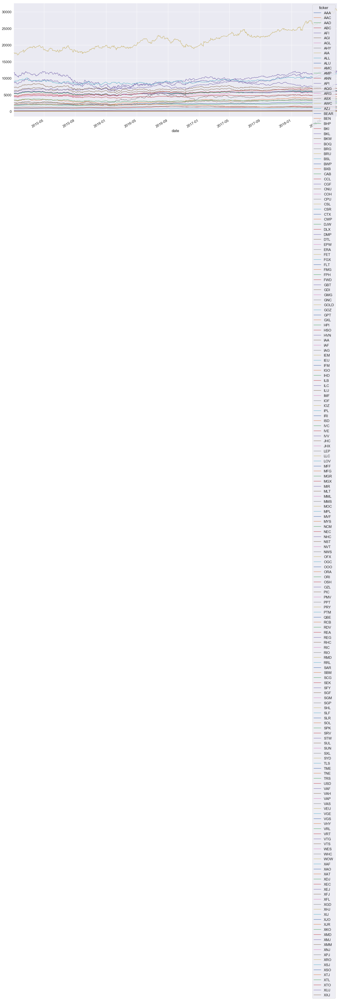

In [13]:
df_close_f.plot(figsize=(25,10),kind='line')

Kinda messy isn't it? so I will select the top 10 and the bottom 10 to analyse the trend

## 2.3. Top 10 , and  Bottom 10 

In [14]:
def plot_10(dataframe,top=True):
    col_list = dataframe.columns
    col_mean = []
    for col in col_list:
        col_mean.append(dataframe[col].mean())
    top10 = sorted(range(len(col_mean)), key=lambda i: col_mean[i])[-10:]
    bot10 = sorted(range(len(col_mean)), key=lambda i: col_mean[i])[:10]
    if top == True:
        plot_df = dataframe.iloc[:, top10]
    else:
        plot_df = dataframe.iloc[:, bot10]
    
    plot_df.plot(figsize=(50,20),fontsize=30,kind='line',linewidth=4)
    plt.legend(fontsize=25)
    plt.grid(True)
    plt.xlabel('date',fontsize=30)
#     plt.title(str(dataframe))

    
#     return plot_df
    

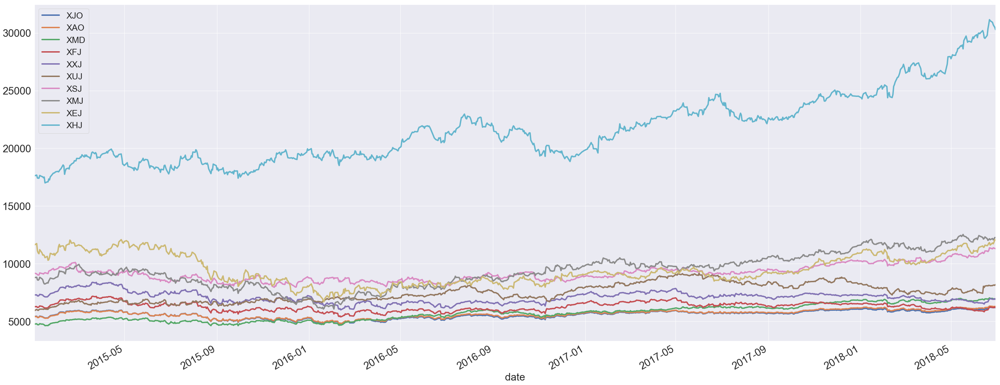

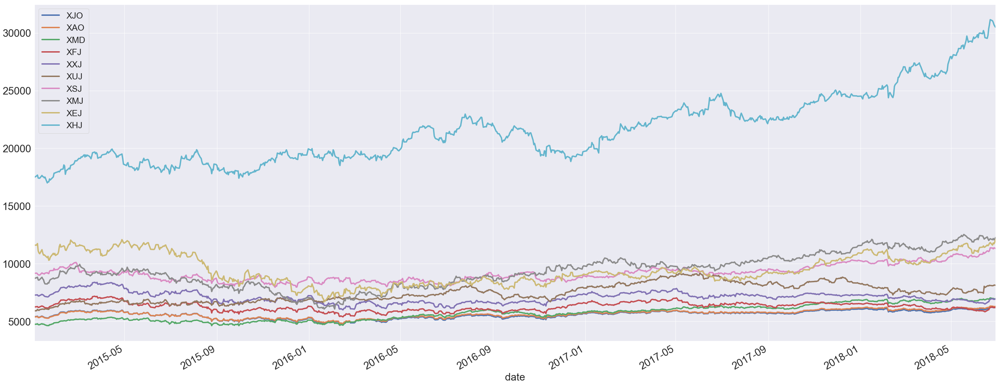

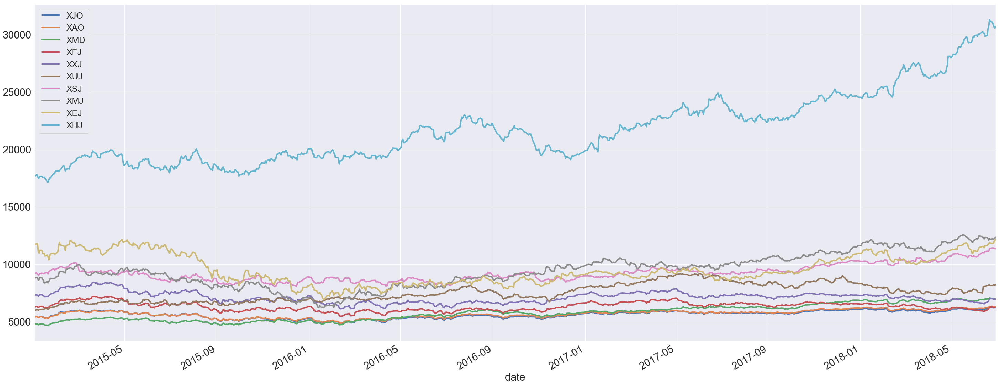

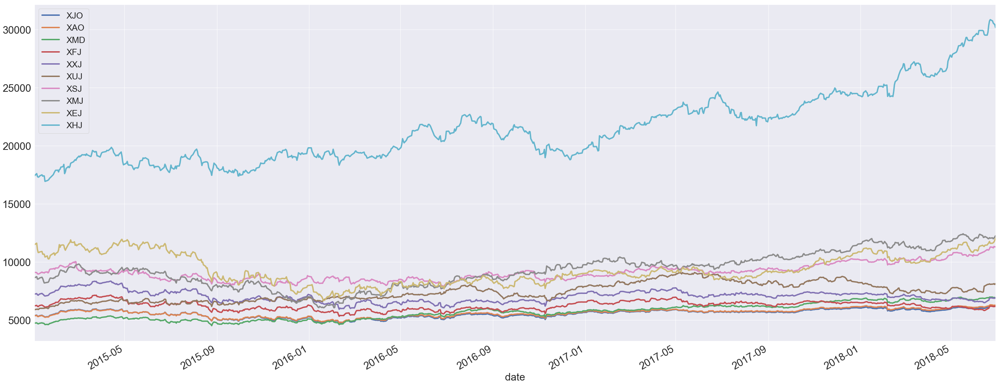

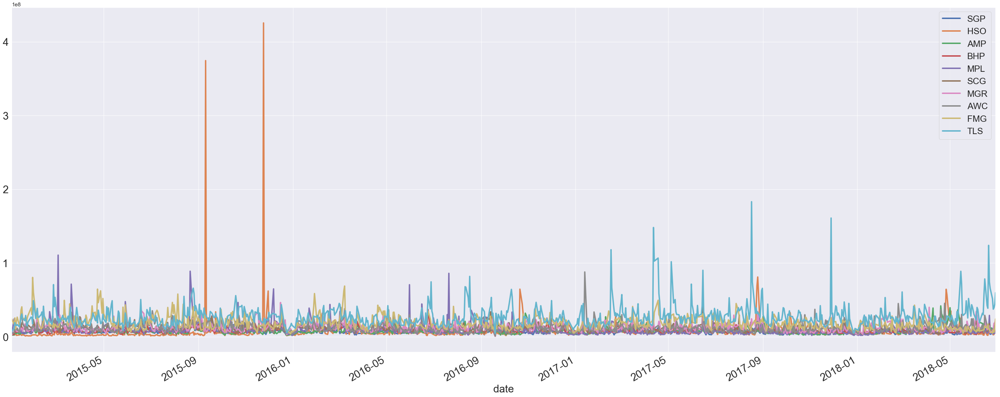

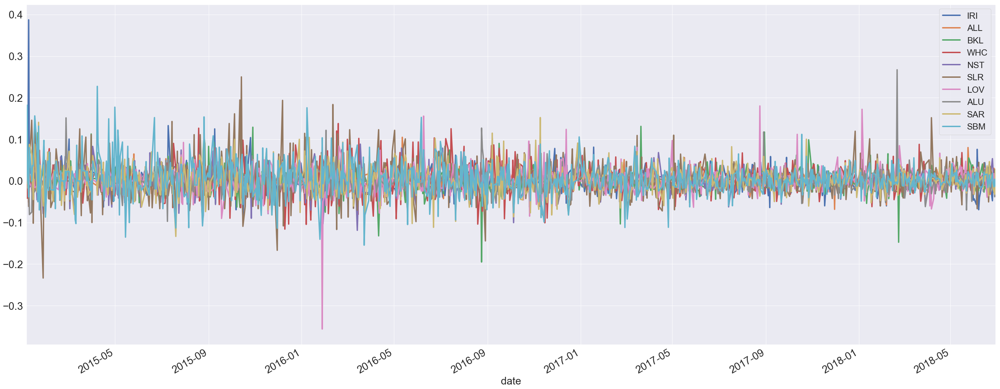

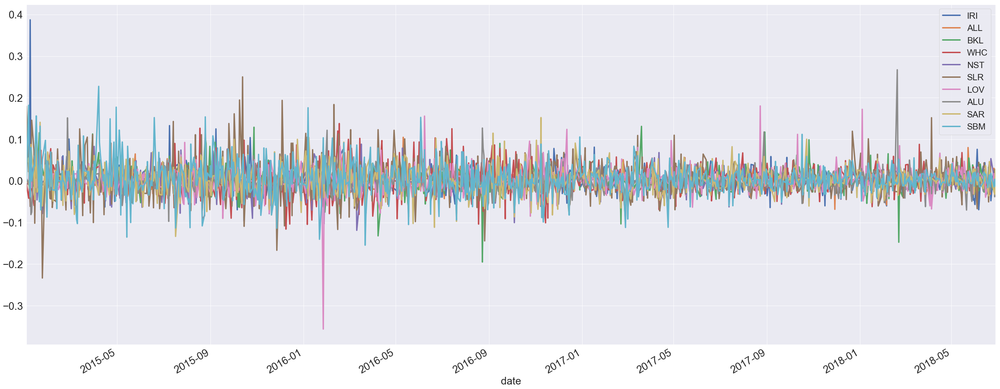

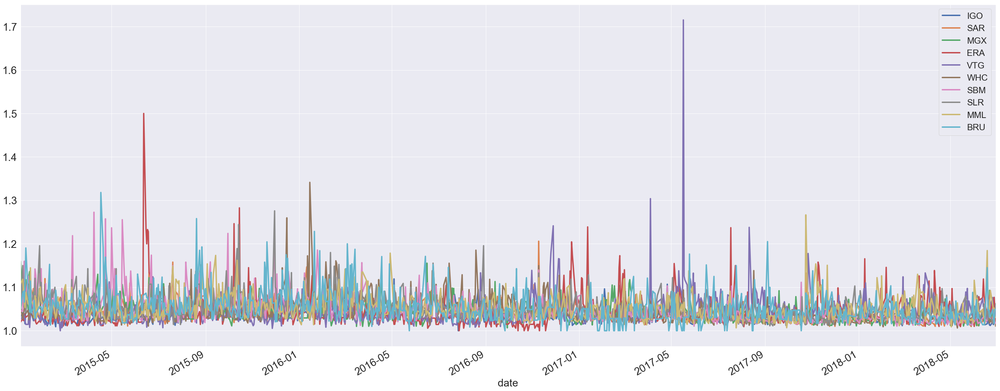

In [15]:
top10 = True
full_df_list = [df_close_f,
                df_open_f,
                df_hi_f,
                df_lo_f,
                df_vol_f,
                df_clos_re_f,
                df_fu_re_f,
                df_hi_lo_f
               ]
#test with opendf
for df in full_df_list:
    plot_10(df,top10)

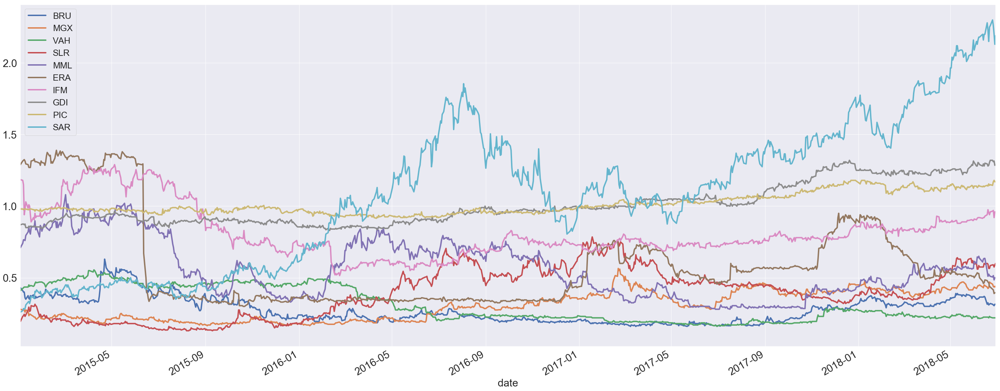

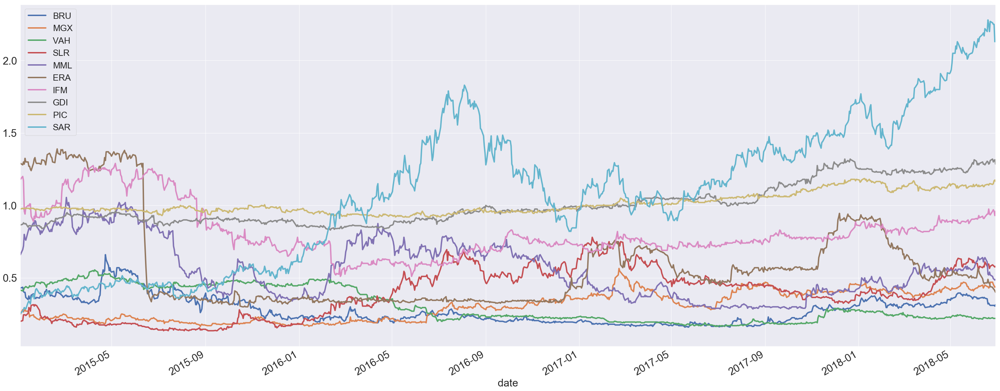

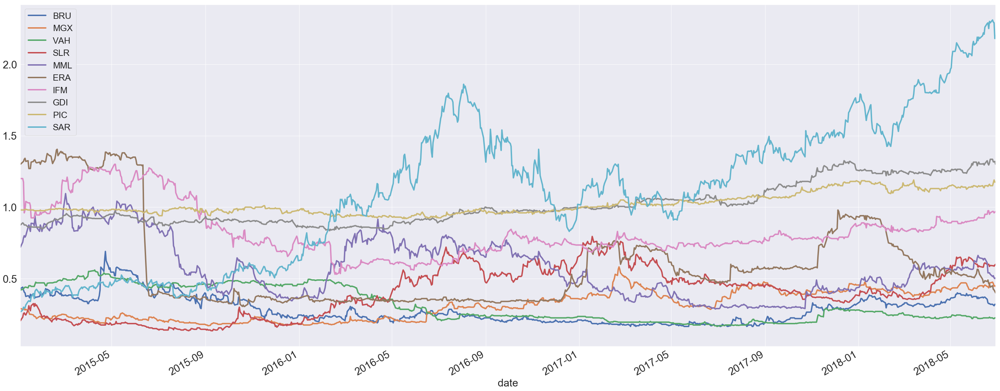

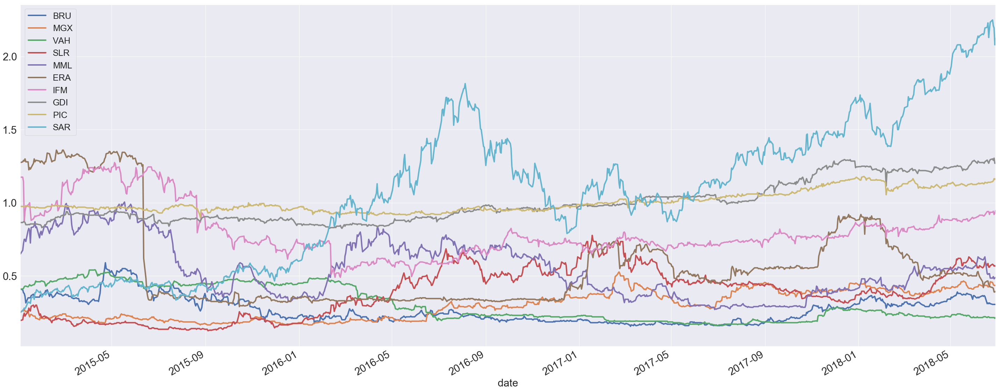

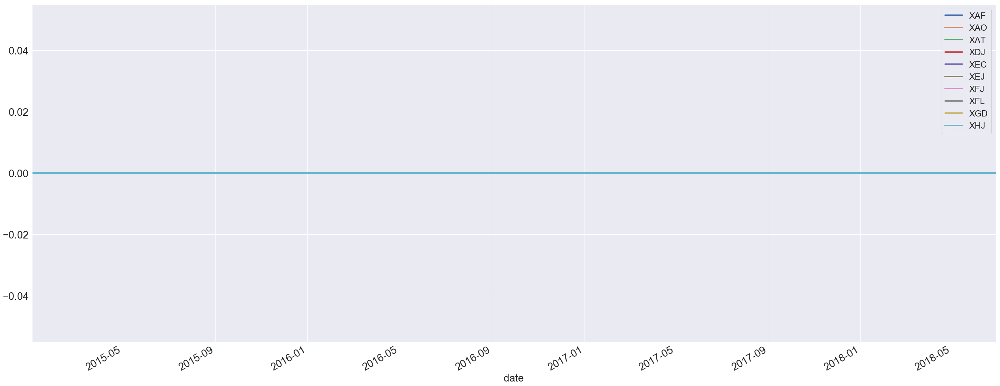

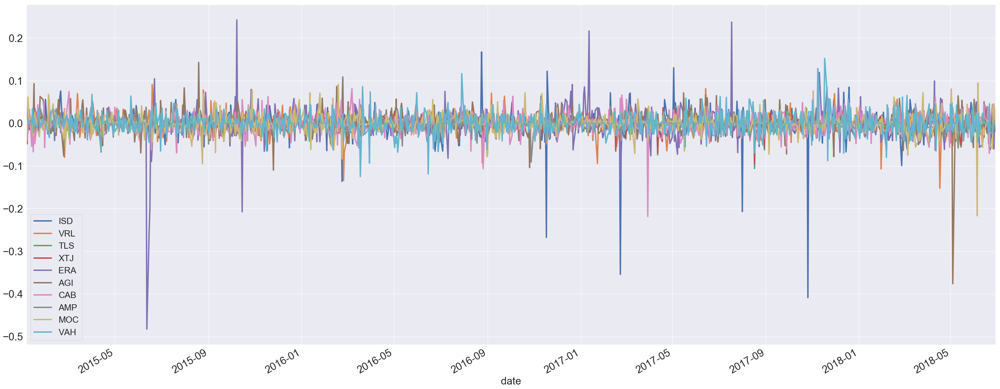

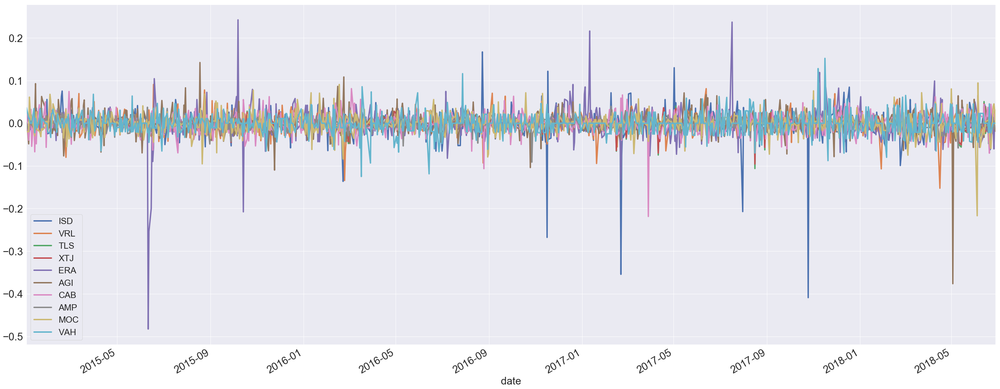

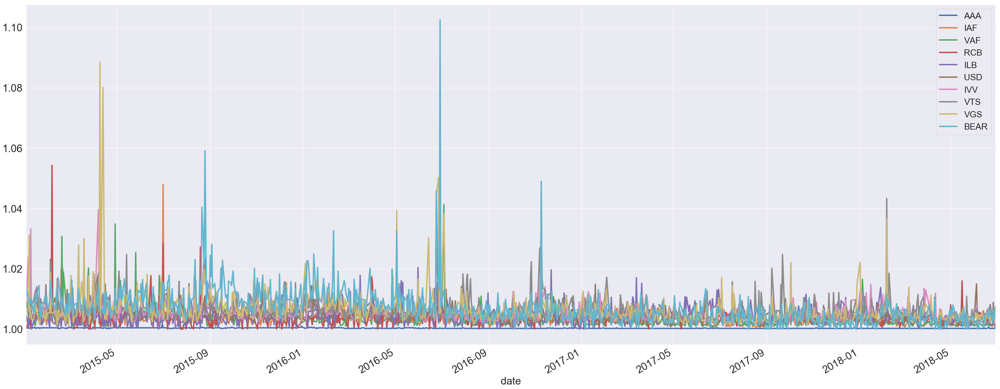

In [16]:
top10 = False
full_df_list = [df_close_f,
                df_open_f,
                df_hi_f,
                df_lo_f,
                df_vol_f,
                df_clos_re_f,
                df_fu_re_f,
                df_hi_lo_f
               ]
#test with opendf
for df in full_df_list:
    plot_10(df,top10)

In [17]:
# delete variables for memory efficiency
del df_open_f 
del df_close_f 
del df_hi_f
del df_lo_f 
del df_vol_f 
del df_clos_re_f 
del df_fu_re_f 
del df_hi_lo_f 
del full_df_list

* Having highly correlated features like high, low, open and close is problematic for simple learning methods like: 
    * linear models (e.g., linear regression or logistic regression), multicolinearity can yield solutions that are wildly varying and possibly numerically unstable.

    * Random forests can be good at detecting interactions between different features, but highly correlated features can mask these interactions.
* However, I to make the most out of all features we currently have, I suggest Using ARIMA  and Neural-Network based techniques(**please view this in the second notebook**)

# 3. Build models (simple linear models)

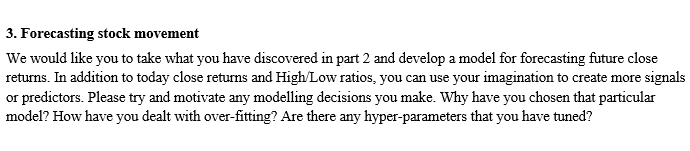
I prefer using h2o library than scikit learn, it fast, it can utilise all our machine resources
and it give my group the rank 5 in our competition with the limited time allowed

#### A. Dataframe selection for building models:
I selected the original dataset with the stocks that have full data Jan 2015 to June 2018;  instead of 8 newly created data frames in task 1 as the following reasons:

* Some stock have incomplete data from Jan 2015 to June 2018, therefore, IT will cause the sparsity in the newly create dataframes in task 1. Hence, handling the highly sparse matrix for modelling is more challenging than using the complete data. <br>
* The sparsity in 8 dataframes in task one also is problematic for machine learning models that I will build later. <br>


* It is time consumming when using all the stock for building our model especially we will encounter the stocks with missing data in the period of Jan 2015 to June 2018.
    * Note :Missing data can be handled, however, for short period of time, I cannot make the fullest analysis to impute these to all our data<br>
    <br>


* The selection of one stock that has the full data from Jan 2015 to June 2018 is to analyse the importance our signals (features), and to fullest benchmarking the performance our models such as ARIMA and Neural Network. When we have selected our best model, we will use that to predict other stocks

<br>



#### B. First I will build the simple following models:
1. Generalise linear models
2. Gradient Boosting

The reason I built these model is to analyse the useful features in the original set as well as the new features that I have created so far
#### C. Next one, I will build the basic model to predict the timeseries data

1. ARIMA

This one is the basic model for the timeseries dataset. However it was not shown the superiority than the Neural Network one

#### D. For the next notebook, I will build these Recurrent Neural Network Based model:
1. GRU
2. Long-Short Term Memory <br>
    2.1. With peephole <br>
    2.2. Normal
3. Basic Recurrent Neural Network

The Neural Networks techniques are powerful for this kind of time series data. It can predict multiple ouputs for our data based on learning the time series


#### E. Dealing with overfitting:
1. Use k-fold cross validation
2. Removing the unsignificant statistically features to avoid "the curse of dimmensionality"
3. Normalise the data
4. Use Regularization term - Elastic net (this is automatic by the h2o) to terminate the large coefficient 
5. Early stopping criteria for Neural-Network techniques

In [18]:
## Uncomment if you haven't install h2o
# ! pip install requests
# ! pip install tabulate
# ! pip install "colorama>=0.3.8"
# ! pip install future
# ! pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o
# h2o.shutdown()

In [19]:
import h2o
h2o.init(nthreads = -1,ip="localhost", port=54321)

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) Client VM (build 25.211-b12, mixed mode)


C:\Anaconda3\lib\site-packages\h2o\backend\server.py:369: UserWarning:   You have a 32-bit version of Java. H2O works best with 64-bit Java.
  Please download the latest 64-bit Java SE JDK from Oracle.

  warn("  You have a 32-bit version of Java. H2O works best with 64-bit Java.\n"


  Starting server from C:\Anaconda3\lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\software\Rpackages\temp\tmpavcsvxgj
  JVM stdout: C:\software\Rpackages\temp\tmpavcsvxgj\h2o_Dev_started_from_python.out
  JVM stderr: C:\software\Rpackages\temp\tmpavcsvxgj\h2o_Dev_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,03 secs
H2O cluster timezone:,Australia/Sydney
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.4
H2O cluster version age:,13 days
H2O cluster name:,H2O_from_python_Dev_amyvty
H2O cluster total nodes:,1
H2O cluster free memory:,247.5 Mb
H2O cluster total cores:,8
H2O cluster allowed cores:,8
H2O cluster status:,"accepting new members, healthy"


## 3.1. Select data for training

* As can be seen in task 2 , high, low, open and close are highly correlated together, so we choose only one amongst 4. We choose close, because it used to model the feature close_return and future return, it might be helpful
* However, I will use all the features and benchmarked by the models in 3.2, so It will be less biased in the feature selection 
* Let's pick one stock among those that have the fullest data to build our model

In [20]:

#new features, to train our model later
full_df['hi-lo'] = full_df['high']-full_df['low']
full_df['sales'] = ((full_df['open']+full_df['close'])/2)*full_df['volume']
full_df = full_df.dropna()
with open(r"full_df.pickle", "wb") as output_file:
    pickle.dump(full_df, output_file)

In [21]:
idx = 10
select_ticker = full_data_ticker[idx]
print("selected stock:  ", select_ticker)

#original df with selected stock
model_df = full_df[full_df.ticker== select_ticker]

#removed all correlated features df with selected stock
# model_df = selected_df_ticker.iloc[:,4:] 
model_df.head()

selected stock:   XSJ


,ticker,open,high,low,close,volume,close_return,future_return,hi_lo,hi-lo,sales
date,,,,,,,,,,,
2015-01-05,XSJ,9187.9,9243.4,9092.5,9127.5,0,-0.006574,-0.009411,1.016596,150.9,0.0
2015-01-06,XSJ,9127.5,9127.5,8990.6,9041.6,0,-0.009411,-0.001947,1.015227,136.9,0.0
2015-01-07,XSJ,9041.6,9052.4,8963.1,9024.0,0,-0.001947,-0.000255,1.009963,89.3,0.0
2015-01-08,XSJ,9024.0,9076.9,8986.2,9021.7,0,-0.000255,0.020562,1.010093,90.7,0.0
2015-01-09,XSJ,9021.7,9207.2,9021.7,9207.2,0,0.020562,-0.005756,1.020562,185.5,0.0


In [22]:
#load into h2o cluster
hf = h2o.H2OFrame(model_df)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [23]:
#split to train/test : 90/10
train,test = hf.split_frame(ratios=[.9])

### 3.2. Build Simple model : Generalised Linear Model to test our predictors

In [24]:
# Generate a GLM model using the training dataset
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

predictors1 = ["close", "volume", "close_return", "hi_lo","hi-lo","sales"] # my assumption
predictors2 = ["open","high","low","close", "volume", "close_return", "hi_lo","hi-lo","sales"] # all features

response_col = "future_return" #our target

#build glm models with 10-fold-CV

glm_model1 = H2OGeneralizedLinearEstimator(family= "gaussian", lambda_ = 0, nfolds = 10,compute_p_values = True,remove_collinear_columns= True)
glm_model1.train(predictors1, response_col, training_frame= train)

glm_model2 = H2OGeneralizedLinearEstimator(family= "gaussian", lambda_ = 0, nfolds = 10,compute_p_values = True,remove_collinear_columns= True)
glm_model2.train(predictors2, response_col, training_frame= train)


glm Model Build progress: |███████████████████████████████████████████████| 100%
glm Model Build progress: |███████████████████████████████████████████████| 100%


* glm_model1 is better than glm_model 2 because we have removed all the highly correlated signal and use only one (open)
* Also, drawing from the tables below, almost all the predictors are useful to predict the future return (p-value <0.01). However the open and close return (of course) seem not to be useful to predict for this model.
* The newly created signal **sales** has been dropped out by the remove_collinear_columns function of the h2o proves that it was not successful for the prediction. However the **High-Low** signal was kept but it is not statitiscally significant . Therefore these 2 newly created signals failed to contribute to the prediction of future return for glm 
* =>>> Hence, the dataframe with removed correlated features gives better result

In [25]:
glm_model1._model_json['output']['coefficients_table']

Coefficients: glm coefficients



names,coefficients,std_error,z_value,p_value,standardized_coefficients
Intercept,-1.2011069,0.7764591,-1.5469029,0.1222933,0.0002050
close,0.0000013,0.0000012,1.0908495,0.2756768,0.0008957
close_return,0.0399135,0.0364147,1.0960824,0.2733819,0.0003744
hi_lo,1.1900238,0.7670456,1.5514381,0.1212034,0.0074440
hi-lo,-0.0001358,0.0000883,-1.5384333,0.1243493,-0.0070856


In [26]:
glm_model2._model_json['output']['coefficients_table']

Coefficients: glm coefficients



names,coefficients,std_error,z_value,p_value,standardized_coefficients
Intercept,-1.1948164,0.7830934,-1.5257649,0.1274759,0.0002050
open,-0.0000675,0.0000563,-1.1989705,0.2309054,-0.0472763
high,-0.0001356,0.0000884,-1.5346492,0.1252776,-0.0945820
low,0.0001342,0.0000903,1.4858094,0.1377357,0.0948807
close,0.0000702,0.0000572,1.2262129,0.2204905,0.0494034
close_return,-0.5672281,0.5012985,-1.1315176,0.2581869,-0.0053212
hi_lo,1.1842602,0.7735887,1.5308654,0.1262102,0.0074080
hi-lo,0.0,nan,nan,nan,0.0


In [27]:
print('removing highly correlated signals:')
print("test_rmse: " ,glm_model1.model_performance(test_data=test).rmse())
print("train_rmse: " ,glm_model1.model_performance(test_data=train).rmse())
print('without removing highly correlated signals:')
print("test_rmse: " ,glm_model2.model_performance(test_data=test).rmse())
print("train_rmse: " ,glm_model2.model_performance(test_data=train).rmse())

removing highly correlated signals:
test_rmse:  0.01135482714458758
train_rmse:  0.00940821466270429
without removing highly correlated signals:
test_rmse:  0.011234031752922475
train_rmse:  0.009399281250573223


### Select the best features for glm training
This time we build the model with the regulisation term - elastic net wil lambda = 0.001 and alpha =0.01 to avoid overfitting

In [28]:
glm_predictors_final = ["low", "close", "close_return"]
glm_model_final = H2OGeneralizedLinearEstimator(family= "gaussian", lambda_ = 0.001,alpha=0.01, nfolds = 10,compute_p_values = False,remove_collinear_columns= True)
glm_model_final.train(glm_predictors_final, response_col, training_frame= train)

glm Model Build progress: |███████████████████████████████████████████████| 100%


In [29]:
glm_model_final._model_json['output']['coefficients_table']

Coefficients: glm coefficients



names,coefficients,standardized_coefficients
Intercept,0.0032957,0.0002050
low,-0.0000031,-0.0021956
close,0.0000027,0.0019334
close_return,0.0313794,0.0002944


In [30]:
print("test_rmse: " ,glm_model_final.model_performance(test_data=test).rmse())
print("train_rmse: " ,glm_model_final.model_performance(test_data=train).rmse())

test_rmse:  0.011459714859541077
train_rmse:  0.00942221427373387


## 3.2. Gradient Boosting

gbm Model Build progress: |███████████████████████████████████████████████| 100%


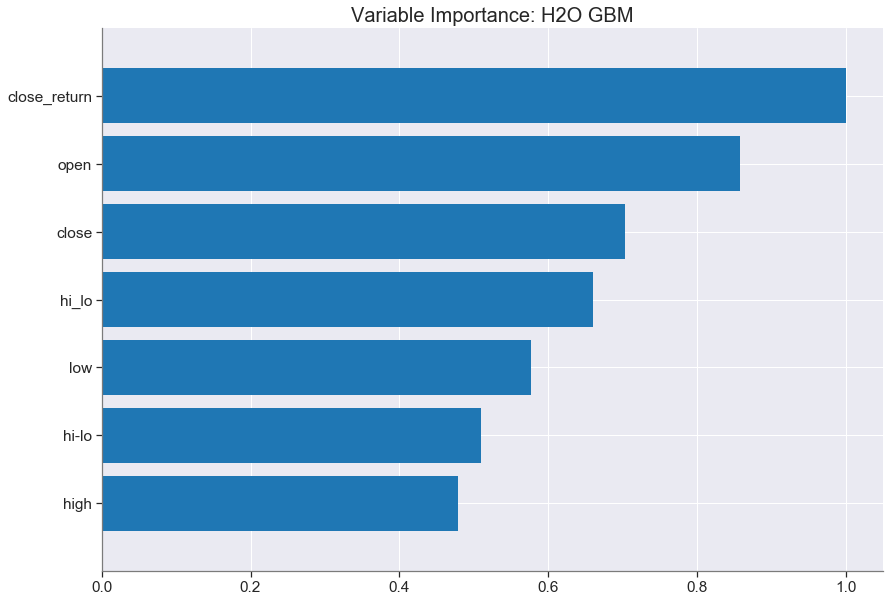

test_rmse:  0.011954947079078196
train_rmse:  0.007786049321951866


In [31]:
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
## Depth 10 is usually plenty of depth for most datasets, but you never know
hyper_params = {'max_depth' : range(1,30,2)}
#hyper_params = {max_depth = [4,6,8,12,16,20]} ##faster for larger datasets

from h2o.estimators.gbm import H2OGradientBoostingEstimator
gbm = H2OGradientBoostingEstimator()


#Train grid search
gbm.train(x=predictors2, 
           y=response_col,
           training_frame = train)
gbm.varimp_plot()
print("test_rmse: " ,gbm.model_performance(test_data=test).rmse())
print("train_rmse: " ,gbm.model_performance(test_data=train).rmse())

gbm Model Build progress: |███████████████████████████████████████████████| 100%


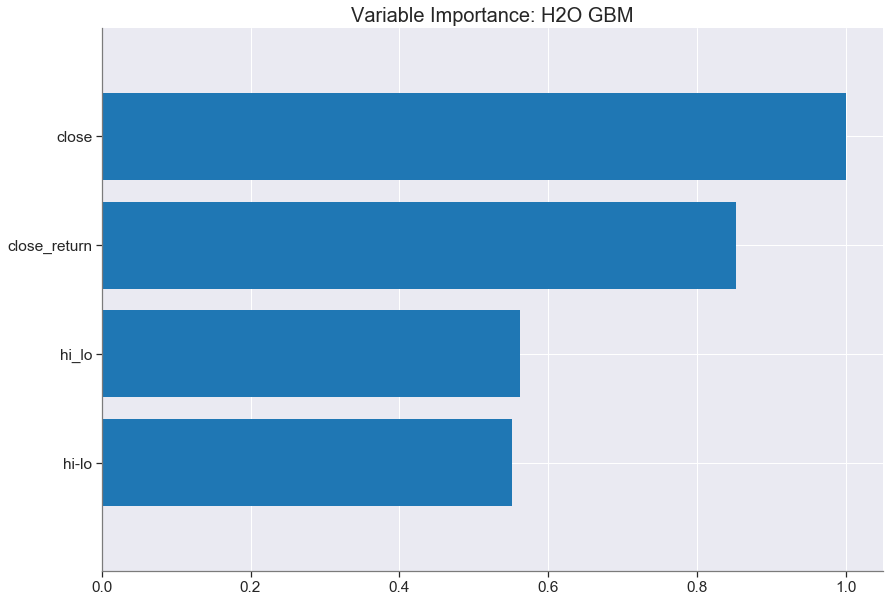

test_rmse:  0.011777059992146071
train_rmse:  0.007985159755289958


In [32]:
gbm.train(x=predictors1, 
           y=response_col,
           training_frame = train)
gbm.varimp_plot()
print("test_rmse: " ,gbm.model_performance(test_data=test).rmse())
print("train_rmse: " ,gbm.model_performance(test_data=train).rmse())

In [33]:
h2o.shutdown()

[WARNING] in <ipython-input-33-1edf85295eae> line 1:
    >>> h2o.shutdown()
        ^^^^ Deprecated, use ``h2o.cluster().shutdown()``.
H2O session _sid_8727 closed.


## 3.3. ARIMA on Future Return

**implementation remarks : Please be noted that the optimal arima parameters in the code has been set, it will be lengthy if i put all the experiments in this notebook**

Inspired by : https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/

In [34]:
# !pip  install mpl-finance
# !pip install plotly
# !pip install statsmodels

In [35]:
import matplotlib
import matplotlib.pylab as plt
import mpl_finance as mpf
matplotlib.style.use('seaborn')
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 5
from plotly.graph_objs import *
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
init_notebook_mode()
from tqdm import tqdm
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')

In [36]:
model_df.head()

,ticker,open,high,low,close,volume,close_return,future_return,hi_lo,hi-lo,sales
date,,,,,,,,,,,
2015-01-05,XSJ,9187.9,9243.4,9092.5,9127.5,0,-0.006574,-0.009411,1.016596,150.9,0.0
2015-01-06,XSJ,9127.5,9127.5,8990.6,9041.6,0,-0.009411,-0.001947,1.015227,136.9,0.0
2015-01-07,XSJ,9041.6,9052.4,8963.1,9024.0,0,-0.001947,-0.000255,1.009963,89.3,0.0
2015-01-08,XSJ,9024.0,9076.9,8986.2,9021.7,0,-0.000255,0.020562,1.010093,90.7,0.0
2015-01-09,XSJ,9021.7,9207.2,9021.7,9207.2,0,0.020562,-0.005756,1.020562,185.5,0.0


In [37]:
# split to train and test df

train_idx = np.random.rand(len(model_df)) < 0.8

train = model_df[train_idx]
test = model_df[~train_idx]

In [38]:
print(len(test))
print(len(train))

186
695


In [39]:
iplot([Scatter(x=train.index, y=train['future_return'])])

In [40]:
iplot([Histogram(x=train['future_return'])])

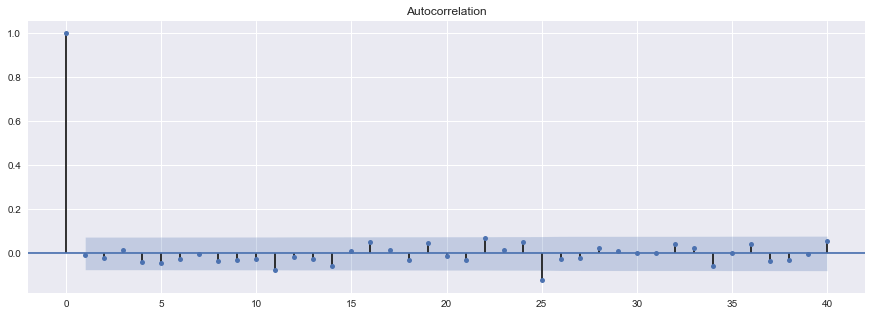

In [41]:
plt = sm.graphics.tsa.plot_acf(train['future_return'], lags=40)
plt.show()

In [42]:
## this takes very long time to train and predict
## uncomment if you want to train and predict again

# from statsmodels.tsa.arima_model import ARIMA
# ts = train['future_return'].as_matrix()
# predictions = np.empty((0), dtype=np.float32)
# n_pre = 881 #predict all the data
# for i in tqdm(range(n_pre)):
#     arima_5_1_0 = ARIMA(ts, order=(5, 1, 0)).fit(dist=False)
#     predict = arima_5_1_0.forecast()[0]
#     predictions = np.hstack([predictions, predict])
#     ts = np.hstack([ts, predict])

#save model and prediction
# with open('arima_5_1_0_pred.pickle','wb') as f:
#       pickle.dump(predictions,f)
# with open('arima_5_1_0_model.pickle','wb') as f:
#       pickle.dump(arima_5_1_0,f)

In [43]:
n_pre = 881 

# load model and prediction from file because training and predicting is time consuming
with open('arima_5_1_0_pred.pickle','rb') as f:
      predictions = pickle.load(f)
with open('arima_5_1_0_model.pickle','rb') as f:
      arima_5_1_0 = pickle.load(f)

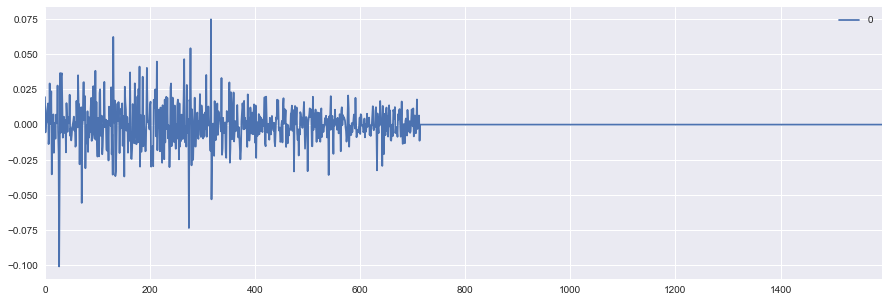

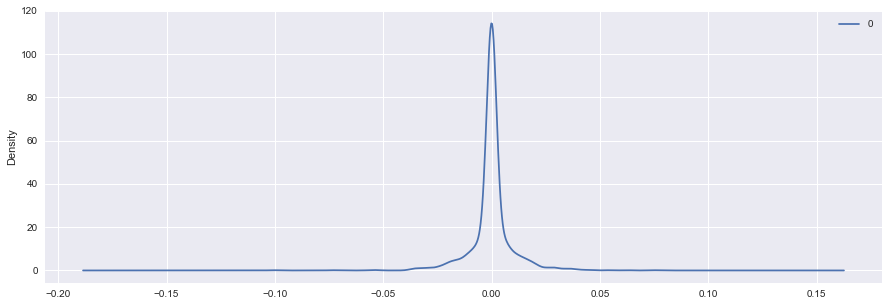

                  0
count  1.594000e+03
mean   9.985974e-06
std    9.849260e-03
min   -1.007516e-01
25%   -3.002414e-09
50%    6.318923e-09
75%    2.099101e-08
max    7.477720e-02


In [44]:
# plot residual errors
residuals = pd.DataFrame(arima_5_1_0.resid)
residuals.plot()
pyplot.show()
residuals.plot(kind='kde')
pyplot.show()
print(residuals.describe())

Seems good, now we plot the prediction on the original set to see how it goes

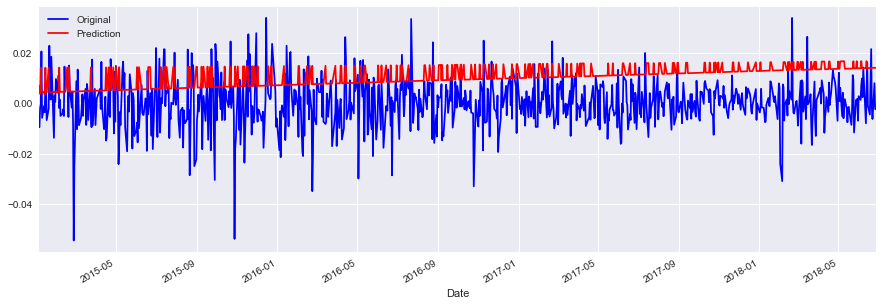

In [45]:
nans = np.zeros(len(train))
nans[:] = np.nan
orgs = pd.concat([train['future_return'], test[:n_pre]['future_return']])
orgs = pd.DataFrame({
    'Date': orgs.index,
    'Original': orgs.as_matrix(),
    'Prediction':  predictions
})
orgs = orgs.set_index('Date')
orgs.plot(color=['blue', 'red'])
plt.show()

ARIMA was not there yet, Let's use more  powerful tools - Neural Network with tensorflow

## 3.4. Neural-networks technique with tensorflow - Please visit the second notebook